In [1]:
# Transformers installation
# ! pip install transformers datasets
# To install from source instead of the last release, comment the command above and uncomment the following one.
# !pip install -U git+https://github.com/huggingface/transformers.git

# Object detection

Object detection is the computer vision task of detecting instances (such as humans, buildings, or cars) in an image. Object detection models receive an image as input and output
coordinates of the bounding boxes and associated labels of the detected objects. An image can contain multiple objects,
each with its own bounding box and a label (e.g. it can have a car and a building), and each object can
be present in different parts of an image (e.g. the image can have several cars).
This task is commonly used in autonomous driving for detecting things like pedestrians, road signs, and traffic lights.
Other applications include counting objects in images, image search, and more.

In this guide, you will learn how to:

 1. Finetune [DETR](https://huggingface.co/docs/transformers/model_doc/detr), a model that combines a convolutional
 backbone with an encoder-decoder Transformer, on the [CPPE-5](https://huggingface.co/datasets/cppe-5)
 dataset.
 2. Use your finetuned model for inference.

<Tip>
The task illustrated in this tutorial is supported by the following model architectures:

<!--This tip is automatically generated by `make fix-copies`, do not fill manually!-->

[Conditional DETR](https://huggingface.co/docs/transformers/main/en/tasks/../model_doc/conditional_detr), [Deformable DETR](https://huggingface.co/docs/transformers/main/en/tasks/../model_doc/deformable_detr), [DETA](https://huggingface.co/docs/transformers/main/en/tasks/../model_doc/deta), [DETR](https://huggingface.co/docs/transformers/main/en/tasks/../model_doc/detr), [Table Transformer](https://huggingface.co/docs/transformers/main/en/tasks/../model_doc/table-transformer), [YOLOS](https://huggingface.co/docs/transformers/main/en/tasks/../model_doc/yolos)

<!--End of the generated tip-->

</Tip>

Before you begin, make sure you have all the necessary libraries installed:

```bash
pip install -q datasets transformers evaluate timm albumentations
```

You'll use 🤗 Datasets to load a dataset from the Hugging Face Hub, 🤗 Transformers to train your model,
and `albumentations` to augment the data. `timm` is currently required to load a convolutional backbone for the DETR model.

We encourage you to share your model with the community. Log in to your Hugging Face account to upload it to the Hub.
When prompted, enter your token to log in:

In [2]:
# from huggingface_hub import notebook_login

# notebook_login()

In [3]:
from pathlib import Path
dataset_checkpoint = "Yorai/detect-waste"
checkpoint = "facebook/detr-resnet-50"

model_name = Path(checkpoint).name
dataset_name = Path(dataset_checkpoint).name

finetuned_name = f"{model_name}_finetuned_{dataset_name}"
finetuned_checkpoint = f"Yorai/{finetuned_name}"
finetuned_checkpoint

'Yorai/detr-resnet-50_finetuned_detect-waste'

## Load the CPPE-5 dataset

The [CPPE-5 dataset](https://huggingface.co/datasets/cppe-5) contains images with
annotations identifying medical personal protective equipment (PPE) in the context of the COVID-19 pandemic.

Start by loading the dataset:

In [4]:
from datasets import load_dataset

# cppe5 = load_dataset(dataset)
ds = load_dataset(dataset_checkpoint)
ds_train = ds["train"]
ds_test = ds["test"]

ds_train = ds_train.select(range(len(ds_train)))
ds_test = ds_test.select(range(len(ds_test)))


Resolving data files:   0%|          | 0/30 [00:00<?, ?it/s]

You'll see that this dataset already comes with a training set containing 1000 images and a test set with 29 images.

To get familiar with the data, explore what the examples look like.

The examples in the dataset have the following fields:
- `image_id`: the example image id
- `image`: a `PIL.Image.Image` object containing the image
- `width`: width of the image
- `height`: height of the image
- `objects`: a dictionary containing bounding box metadata for the objects in the image:
  - `id`: the annotation id
  - `area`: the area of the bounding box
  - `bbox`: the object's bounding box (in the [COCO format](https://albumentations.ai/docs/getting_started/bounding_boxes_augmentation/#coco) )
  - `category`: the object's category, with possible values including `Coverall (0)`, `Face_Shield (1)`, `Gloves (2)`, `Goggles (3)` and `Mask (4)`

You may notice that the `bbox` field follows the COCO format, which is the format that the DETR model expects.
However, the grouping of the fields inside `objects` differs from the annotation format DETR requires. You will
need to apply some preprocessing transformations before using this data for training.

To get an even better understanding of the data, visualize an example in the dataset.

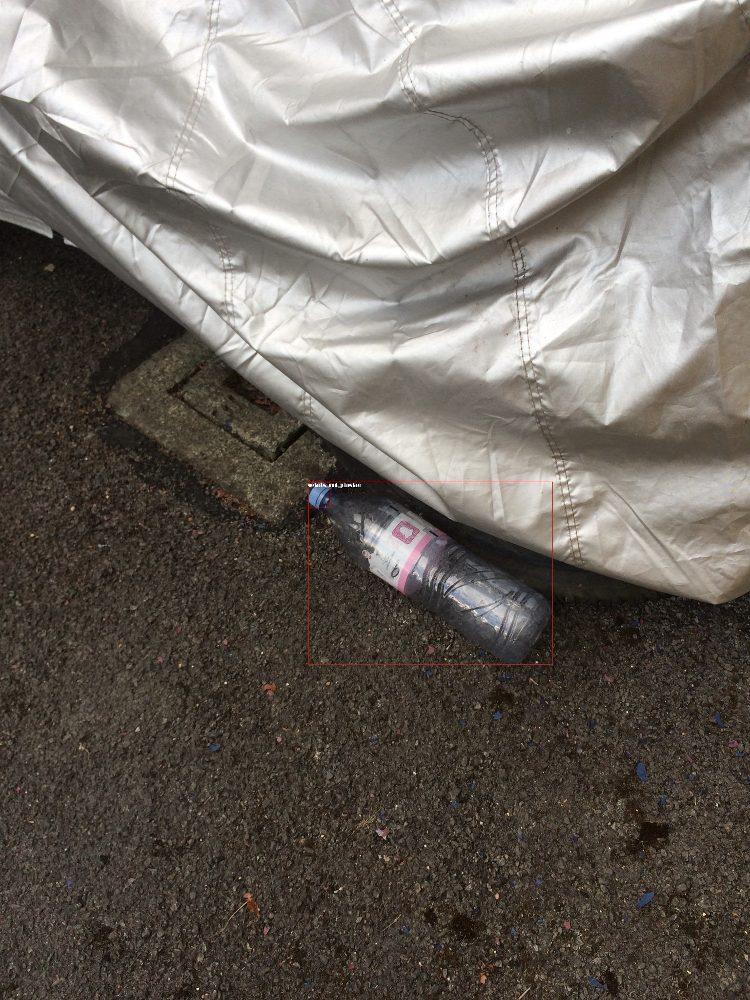

In [ ]:
import numpy as np
import os
from PIL import Image, ImageDraw

image = ds_train[0]["image"]
annotations = ds_train[0]["objects"]
draw = ImageDraw.Draw(image)

categories = ds_train.features["objects"].feature["category"].names

id2label = {index: x for index, x in enumerate(categories, start=0)}
label2id = {v: k for k, v in id2label.items()}

for i in range(len(annotations["id"])):
    box = annotations["bbox"][i - 1]
    class_idx = annotations["category"][i - 1]
    x, y, w, h = tuple(box)
    draw.rectangle((x, y, x + w, y + h), outline="red", width=1)
    draw.text((x, y), id2label[class_idx], fill="white")

image

In [ ]:
remove_idx = [530]
keep = [i for i in range(len(ds_train)) if i not in remove_idx]
ds_train = ds_train.select(keep)
# for i,example in enumerate(cppe5["train"]):
#     width = example['width']
#     height = example['height']
#     objects = example['objects']
#     bboxes = objects['bbox']
#     for bbox in bboxes:
#         x_min, y_min, bbox_width, bbox_height = bbox
#         bad = False
#         if  x_min < 0:
#             bad = True
#             print("SMALL X",x_min)
#         if y_min < 0:
#             bad = True
#             print("SMALL Y",y_min)
#         if  x_min+bbox_width > width:
#             bad = True
#             print("BIG X",width, x_min+bbox_width)
#         if y_min+bbox_height > height:
#             bad = True
#             print("BIG Y",height, y_min+bbox_height)
#         if bad:
#             print(f"were issues with {i=} {example['image_id']=}")

In [ ]:
from collections import defaultdict
from statistics import mean
import random
from datasets import interleave_datasets
from collections import defaultdict
from tqdm import tqdm


categories_indexes = defaultdict(set)
for i,example in enumerate(ds_train):
    for category in example["objects"]["category"]:
        categories_indexes[category].add(i)
k = 60#int(mean(len(indexes) for indexes in categories_indexes.values()))
chosen = {}
for category, indexes in categories_indexes.items():
    chosen[category] = random.choices(list(indexes), k=k)

dataset = interleave_datasets([ds_train.select(chosen[category]) for category in chosen.keys()])
categories_indexes = defaultdict(set)
for i,example in tqdm(enumerate(dataset)):
    for category in example["objects"]["category"]:
        categories_indexes[category].add(i)
for category, indexes in categories_indexes.items():
    print(f"{category}: {len(indexes)}")
ds_train = dataset
# ds_train = ds_train.select(range((168)))


## Preprocess the data

To finetune a model, you must preprocess the data you plan to use to match precisely the approach used for the pre-trained model.
[AutoImageProcessor](https://huggingface.co/docs/transformers/main/en/model_doc/auto#transformers.AutoImageProcessor) takes care of processing image data to create `pixel_values`, `pixel_mask`, and
`labels` that a DETR model can train with. The image processor has some attributes that you won't have to worry about:

- `image_mean = [0.485, 0.456, 0.406 ]`
- `image_std = [0.229, 0.224, 0.225]`

These are the mean and standard deviation used to normalize images during the model pre-training. These values are crucial
to replicate when doing inference or finetuning a pre-trained image model.

Instantiate the image processor from the same checkpoint as the model you want to finetune.

In [ ]:
from transformers import AutoImageProcessor

# checkpoint = "facebook/yolos-tiny"
image_processor = AutoImageProcessor.from_pretrained(checkpoint)
type(image_processor)

Could not find image processor class in the image processor config or the model config. Loading based on pattern matching with the model's feature extractor configuration.
The `max_size` parameter is deprecated and will be removed in v4.26. Please specify in `size['longest_edge'] instead`.


transformers.models.detr.image_processing_detr.DetrImageProcessor

Before passing the images to the `image_processor`, apply two preprocessing transformations to the dataset:
- Augmenting images
- Reformatting annotations to meet DETR expectations

First, to make sure the model does not overfit on the training data, you can apply image augmentation with any data augmentation library. Here we use [Albumentations](https://albumentations.ai/docs/) ...
This library ensures that transformations affect the image and update the bounding boxes accordingly.
The 🤗 Datasets library documentation has a detailed [guide on how to augment images for object detection](https://huggingface.co/docs/datasets/object_detection),
and it uses the exact same dataset as an example. Apply the same approach here, resize each image to (480, 480),
flip it horizontally, and brighten it:

In [ ]:
import albumentations
import numpy as np
import torch

transform = albumentations.Compose(
    [
        albumentations.Resize(1024, 1024),
        # albumentations.BBoxSafeRandomCrop(p=0.2),
        # albumentations.Affine(p=0.3),
        albumentations.HorizontalFlip(p=0.3),
        albumentations.Flip(p=0.3),
        albumentations.RandomBrightnessContrast(p=0.3),
        # albumentations.RandomGamma(p=0.3),
        # albumentations.CLAHE(p=0.3),
        # albumentations.HueSaturationValue(p=0.3),
        # albumentations.ShiftScaleRotate(p=0.3),
        # albumentations.Normalize(p=0.3),
        # albumentations.MotionBlur(p=0.3),
    ],
    bbox_params=albumentations.BboxParams(format="coco", label_fields=["category"]),
)

The `image_processor` expects the annotations to be in the following format: `{'image_id': int, 'annotations': List[Dict]}`,
 where each dictionary is a COCO object annotation. Let's add a function to reformat annotations for a single example:

In [ ]:
def formatted_anns(image_id, category, area, bbox):
    annotations = []
    for i in range(0, len(category)):
        new_ann = {
            "image_id": image_id,
            "category_id": category[i],
            "isCrowd": 0,
            "area": area[i],
            "bbox": list(bbox[i]),
        }
        annotations.append(new_ann)

    return annotations

Now you can combine the image and annotation transformations to use on a batch of examples:

In [ ]:
# transforming a batch
def transform_aug_ann(examples):
    image_ids = examples["image_id"]
    images, bboxes, area, categories = [], [], [], []
    for image, objects in zip(examples["image"], examples["objects"]):
        image = np.array(image.convert("RGB"))[:, :, ::-1]
        
        out = transform(image=image, bboxes=objects["bbox"], category=objects["category"])

        area.append(objects["area"])
        images.append(out["image"])
        bboxes.append(out["bboxes"])
        categories.append(out["category"])

    targets = [
        {"image_id": id_, "annotations": formatted_anns(id_, cat_, ar_, box_)}
        for id_, cat_, ar_, box_ in zip(image_ids, categories, area, bboxes)
    ]

    return image_processor(images=images, annotations=targets, return_tensors="pt")

Apply this preprocessing function to the entire dataset using 🤗 Datasets [with_transform](https://huggingface.co/docs/datasets/main/en/package_reference/main_classes#datasets.Dataset.with_transform) method. This method applies
transformations on the fly when you load an element of the dataset.

At this point, you can check what an example from the dataset looks like after the transformations. You should see a tensor
with `pixel_values`, a tensor with `pixel_mask`, and `labels`.

In [ ]:
# import torch
split_ds_train = ds_train.train_test_split(test_size=0.1, seed=42, shuffle=True).with_transform(transform_aug_ann)
ds_train_augmented = split_ds_train["train"]
ds_val_augmented = split_ds_train["test"]
ds_test_augmented = ds_test.with_transform(transform_aug_ann)
# for i,example in enumerate(cppe5["train"]):
    # pass
# print("OK")
    

You have successfully augmented the individual images and prepared their annotations. However, preprocessing isn't
complete yet. In the final step, create a custom `collate_fn` to batch images together.
Pad images (which are now `pixel_values`) to the largest image in a batch, and create a corresponding `pixel_mask`
to indicate which pixels are real (1) and which are padding (0).

In [ ]:
def collate_fn(batch):
    pixel_values = [item["pixel_values"] for item in batch]
    # encoding = image_processor.pad(pixel_values, return_tensors="pt")
    encoding = image_processor.pad(pixel_values, return_tensors="pt")
    labels = [item["labels"] for item in batch]
    batch = {}
    batch["pixel_values"] = encoding["pixel_values"]
    if "pixel_mask" in encoding:
        batch["pixel_mask"] = encoding["pixel_mask"]
    batch["labels"] = labels
    return batch

## Training the DETR model

You have done most of the heavy lifting in the previous sections, so now you are ready to train your model!
The images in this dataset are still quite large, even after resizing. This means that finetuning this model will
require at least one GPU.

Training involves the following steps:
1. Load the model with [AutoModelForObjectDetection](https://huggingface.co/docs/transformers/main/en/model_doc/auto#transformers.AutoModelForObjectDetection) using the same checkpoint as in the preprocessing.
2. Define your training hyperparameters in [TrainingArguments](https://huggingface.co/docs/transformers/main/en/main_classes/trainer#transformers.TrainingArguments).
3. Pass the training arguments to [Trainer](https://huggingface.co/docs/transformers/main/en/main_classes/trainer#transformers.Trainer) along with the model, dataset, image processor, and data collator.
4. Call [train()](https://huggingface.co/docs/transformers/main/en/main_classes/trainer#transformers.Trainer.train) to finetune your model.

When loading the model from the same checkpoint that you used for the preprocessing, remember to pass the `label2id`
and `id2label` maps that you created earlier from the dataset's metadata. Additionally, we specify `ignore_mismatched_sizes=True` to replace the existing classification head with a new one.

In [ ]:
from transformers import AutoModelForObjectDetection

model = AutoModelForObjectDetection.from_pretrained(
    checkpoint,
    num_labels=7,
    id2label=id2label,
    label2id=label2id,
    ignore_mismatched_sizes=True,
    num_queries=10,
    # keys_to_ignore_at_inference=["loss_dict"],
)

Some weights of the model checkpoint at facebook/detr-resnet-50 were not used when initializing DetrForObjectDetection: ['model.backbone.conv_encoder.model.layer2.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer3.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer1.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer4.0.downsample.1.num_batches_tracked']
- This IS expected if you are initializing DetrForObjectDetection from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing DetrForObjectDetection from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of DetrForObjectDetection were not initialized from the model checkpoin

In [ ]:
model

DetrForObjectDetection(
  (model): DetrModel(
    (backbone): DetrConvModel(
      (conv_encoder): DetrConvEncoder(
        (model): FeatureListNet(
          (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
          (bn1): DetrFrozenBatchNorm2d()
          (act1): ReLU(inplace=True)
          (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
          (layer1): Sequential(
            (0): Bottleneck(
              (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
              (bn1): DetrFrozenBatchNorm2d()
              (act1): ReLU(inplace=True)
              (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
              (bn2): DetrFrozenBatchNorm2d()
              (drop_block): Identity()
              (act2): ReLU(inplace=True)
              (aa): Identity()
              (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      

In the [TrainingArguments](https://huggingface.co/docs/transformers/main/en/main_classes/trainer#transformers.TrainingArguments) use `output_dir` to specify where to save your model, then configure hyperparameters as you see fit.
It is important you do not remove unused columns because this will drop the image column. Without the image column, you
can't create `pixel_values`. For this reason, set `remove_unused_columns` to `False`.
If you wish to share your model by pushing to the Hub, set `push_to_hub` to `True` (you must be signed in to Hugging
Face to upload your model).

In [ ]:
from transformers import TrainingArguments, IntervalStrategy, SchedulerType

training_args = TrainingArguments(
    output_dir=finetuned_name,
    evaluation_strategy=IntervalStrategy.STEPS,
    eval_steps=50,
    save_steps=500,
    logging_steps=50,
    save_total_limit=5,
    load_best_model_at_end=True,
    metric_for_best_model="map_50",
    greater_is_better=True,
    auto_find_batch_size=True,
    dataloader_drop_last = True,
    per_device_train_batch_size=32,
    per_device_eval_batch_size=32,
    num_train_epochs=100,
    dataloader_num_workers=4,
    # fp16=True,
    learning_rate=5e-5,
    # lr_scheduler_type=SchedulerType.POLYNOMIAL,
    # learning_rate=1e-5,
    # weight_decay=1e-4,
    remove_unused_columns=False,
    # label_smoothing_factor=0.1,
    push_to_hub=True,
    # debug=underflow_overflow,
    
)

NameError: name 'finetuned_name' is not defined

Finally, bring everything together, and call [train()](https://huggingface.co/docs/transformers/main/en/main_classes/trainer#transformers.Trainer.train):

In [ ]:
from transformers import Trainer, EarlyStoppingCallback, EvalPrediction
from transformers.models.detr.modeling_detr import DetrObjectDetectionOutput
import functools
from torchmetrics.detection import MeanAveragePrecision

# o = None
# def compute_metrics(outputs):
#     predictions, labels = outputs
#     print(type(predictions))
#     print((labels))
#     orig_target_sizes = torch.stack([target["orig_size"] for target in labels], dim=0)
#     results = image_processor.post_process_object_detection(outputs,threshold=0,target_sizes=orig_target_sizes)  # convert outputs of model to COCO api

#     module = evaluate.load("ybelkada/cocoevaluate", coco=test_ds_coco_format.coco)
#     module.add(prediction=results, reference=labels)
# #   labels = [
# #             {k: v for k, v in t.items()} for t in batch["labels"]
# #         ]  # these are in DETR format, resized + normalized


def compute_metrics(eval_pred: EvalPrediction, meanAveragePrecision: MeanAveragePrecision):
    (loss_dict, scores, pred_boxes, last_hidden_state, encoder_last_hidden_state), labels = eval_pred
    # scores shape: (batch_size, number of detected anchors, num_classes + 1) last class is the no-object class
    # pred_boxes shape: (batch_size, number of detected anchors, 4)
    # https://github.com/openvinotoolkit/open_model_zoo/blob/master/models/public/detr-resnet50/README.md
    predictions = []
    for score, box in zip(scores, pred_boxes):
        # Extract the bounding boxes, labels, and scores from the model's output
        pred_scores = torch.from_numpy(score[:, :-1])  # Exclude the no-object class
        pred_boxes = torch.from_numpy(box)
        pred_labels = torch.argmax(pred_scores, dim=-1)

        # Get the scores corresponding to the predicted labels
        pred_scores_for_labels = torch.gather(pred_scores, 1, pred_labels.unsqueeze(-1)).squeeze(-1)
        predictions.append(
            {
                "boxes": pred_boxes,
                "scores": pred_scores_for_labels,
                "labels": pred_labels,
            }
        )
    # target = [
    #     {
    #         "boxes": torch.from_numpy(labels[i]["boxes"]),
    #         "labels": torch.from_numpy(labels[i]["class_labels"]),
    #     }
    #     for i in range(len(labels) for labels in labels_batched)
    # ]
    target = list(map(lambda label: {"boxes": torch.from_numpy(label["boxes"]), "labels": torch.from_numpy(label["class_labels"])},sum(labels,[])))
    meanAveragePrecision.update(preds=predictions, target=target)
    results = meanAveragePrecision.compute()
    # Convert tensors to scalars/lists, MLFlow doesn't really like tensors
    results = {k: v.tolist() if isinstance(v, torch.Tensor) else v for k, v in results.items()}
    return results

mAP = MeanAveragePrecision(box_format="cxcywh", class_metrics=True)
compute_metrics = functools.partial(compute_metrics, meanAveragePrecision=mAP)#, image_processor=image_processor)
#     model=model,
#     args=training_args,
#     data_collator=lambda batch: collate_fn(batch, image_processor),
#     train_dataset=train_ds,
#     tokenizer=image_processor,
#     eval_dataset=test_ds,
#     compute_metrics=metrics,
#     # preprocess_logits_for_metrics=lambda logits, labels: logits[1:], # This is another way to remove the extra dict
# )


trainer = Trainer(
    model=model,
    
    args=training_args,
    data_collator=collate_fn,
    train_dataset=ds_train_augmented,
    eval_dataset=ds_val_augmented,
    callbacks=[EarlyStoppingCallback(early_stopping_patience=3)],
    tokenizer=image_processor,
    compute_metrics=compute_metrics,
    # preprocess_logits_for_metrics=lambda logits, labels: logits[1:], # This is another way to remove the extra dict
    
)
training_output = trainer.train()#.evaluate(ds_val_augmented)
# training_output

Step,Training Loss,Validation Loss,Map,Map 50,Map 75,Map Small,Map Medium,Map Large,Mar 1,Mar 10,Mar 100,Mar Small,Mar Medium,Mar Large,Map Per Class,Mar 100 Per Class,Classes
1,No log,6.312591,0.010004,0.014511,0.012938,0.010004,-1.000000,-1.000000,0.020468,0.038363,0.038363,0.038363,-1.000000,-1.000000,"[0.006789250299334526, 0.043231599032878876, 0.0, 0.0, -1.0, 0.0]","[0.04444444552063942, 0.1473684161901474, 0.0, 0.0, -1.0, 0.0]","[0, 2, 3, 4, 5, 6]"
2,No log,5.504645,0.004735,0.007578,0.006020,0.004735,-1.000000,-1.000000,0.016199,0.035702,0.035702,0.035702,-1.000000,-1.000000,"[0.0033326465636491776, 0.02034100517630577, 0.0, 0.0, -1.0, 0.0]","[0.0416666679084301, 0.13684210181236267, 0.0, 0.0, -1.0, 0.0]","[0, 2, 3, 4, 5, 6]"
3,No log,5.511797,0.004714,0.006622,0.005659,0.004714,-1.000000,-1.000000,0.019883,0.034639,0.034639,0.034639,-1.000000,-1.000000,"[0.012536761350929737, 0.011031893081963062, 0.0, 0.0, -1.0, 0.0]","[0.05740740895271301, 0.11578947305679321, 0.0, 0.0, -1.0, 0.0]","[0, 2, 3, 4, 5, 6]"
4,No log,5.958500,0.005384,0.007661,0.006172,0.005384,-1.000000,-1.000000,0.018187,0.033670,0.033670,0.033670,-1.000000,-1.000000,"[0.01998252235352993, 0.006937049794942141, 0.0, 0.0, -1.0, 0.0]","[0.07361111044883728, 0.09473684430122375, 0.0, 0.0, -1.0, 0.0]","[0, 2, 3, 4, 5, 6]"
5,No log,5.305817,0.003517,0.005543,0.003894,0.003517,-1.000000,-1.000000,0.016994,0.031135,0.031135,0.031135,-1.000000,-1.000000,"[0.012100632302463055, 0.005482285283505917, 0.0, 0.0, -1.0, 0.0]","[0.07777778059244156, 0.07789473980665207, 0.0, 0.0, -1.0, 0.0]","[0, 2, 3, 4, 5, 6]"
6,No log,5.740501,0.002544,0.004525,0.002674,0.002544,-1.000000,-1.000000,0.015828,0.029981,0.029981,0.029981,-1.000000,-1.000000,"[0.009171136654913425, 0.003548532724380493, 0.0, 0.0, -1.0, 0.0]","[0.08148147910833359, 0.06842105090618134, 0.0, 0.0, -1.0, 0.0]","[0, 2, 3, 4, 5, 6]"
7,No log,5.088975,0.002150,0.004253,0.001854,0.002150,-1.000000,-1.000000,0.014987,0.028864,0.028864,0.028864,-1.000000,-1.000000,"[0.007824142463505268, 0.0029233817476779222, 0.0, 0.0, -1.0, 0.0]","[0.08492063730955124, 0.05939849466085434, 0.0, 0.0, -1.0, 0.0]","[0, 2, 3, 4, 5, 6]"
8,No log,5.191566,0.002129,0.004390,0.001998,0.002129,-1.000000,-1.000000,0.014225,0.028662,0.028662,0.028662,-1.000000,-1.000000,"[0.008241688832640648, 0.00240491796284914, 0.0, 0.0, -1.0, 0.0]","[0.08541666716337204, 0.057894736528396606, 0.0, 0.0, -1.0, 0.0]","[0, 2, 3, 4, 5, 6]"
9,No log,5.031111,0.001760,0.003824,0.001705,0.001760,-1.000000,-1.000000,0.012768,0.027277,0.027277,0.027277,-1.000000,-1.000000,"[0.006422957871109247, 0.0023788842372596264, 0.0, 0.0, -1.0, 0.0]","[0.08024691045284271, 0.05614035204052925, 0.0, 0.0, -1.0, 0.0]","[0, 2, 3, 4, 5, 6]"
10,No log,4.805945,0.001632,0.003701,0.001529,0.001632,-1.000000,-1.000000,0.012158,0.026205,0.026205,0.026205,-1.000000,-1.000000,"[0.005980809684842825, 0.002179799135774374, 0.0, 0.0, -1.0, 0.0]","[0.07944444566965103, 0.05157894641160965, 0.0, 0.0, -1.0, 0.0]","[0, 2, 3, 4, 5, 6]"


In [21]:
training_output

{'eval_loss': 8.161402702331543,
 'eval_map': 0.0021746535785496235,
 'eval_map_50': 0.0044554453343153,
 'eval_map_75': 0.00043611504952423275,
 'eval_map_small': 0.0021746535785496235,
 'eval_map_medium': -1.0,
 'eval_map_large': -1.0,
 'eval_mar_1': 0.009707602672278881,
 'eval_mar_10': 0.02766081877052784,
 'eval_mar_100': 0.02766081877052784,
 'eval_mar_small': 0.02766081877052784,
 'eval_mar_medium': -1.0,
 'eval_mar_large': -1.0,
 'eval_map_per_class': [0.006930693052709103,
  -1.0,
  0.0039425743743777275,
  0.0,
  0.0,
  0.0],
 'eval_mar_100_per_class': [0.02777777798473835,
  -1.0,
  0.11052631586790085,
  0.0,
  0.0,
  0.0],
 'eval_classes': [0, 1, 2, 3, 4, 6],
 'eval_runtime': 2.2189,
 'eval_samples_per_second': 7.661,
 'eval_steps_per_second': 2.253}

In [82]:
tuple(v for k, v in outputs.items())

(tensor([[[-2.4745e-01, -5.9737e-01,  3.0578e-01,  ..., -7.3541e-01,
            6.7950e-01,  3.6503e+00],
          [-7.6754e-01, -5.1851e-01,  1.3492e-01,  ..., -9.4046e-01,
           -1.5171e-01,  4.7865e+00],
          [-7.5113e-02, -1.2120e-01,  5.3457e-01,  ..., -3.9666e-01,
           -3.5209e-01,  3.5736e+00],
          ...,
          [-1.1697e-01, -3.1405e-01,  5.6616e-01,  ..., -8.3898e-01,
            5.3757e-01,  4.1012e+00],
          [-4.1716e-01,  3.9140e-01,  2.6345e-01,  ..., -3.6535e-01,
           -1.2984e-01,  4.2176e+00],
          [ 1.2338e-01, -1.2812e-01,  6.5520e-01,  ..., -6.0836e-01,
            4.4942e-01,  3.8335e+00]],
 
         [[-1.6826e+00, -7.3484e-01,  3.8401e-02,  ..., -5.5009e-01,
           -4.6624e-01,  5.5955e+00],
          [-2.4164e-01, -1.2520e-01,  2.6566e-01,  ..., -5.6864e-01,
            1.8933e-01,  3.5101e+00],
          [-3.3194e-01,  1.7135e-01,  4.6497e-01,  ..., -3.9635e-01,
           -1.8276e-01,  4.0361e+00],
          ...,
    

In [76]:
DetrObjectDetectionOutput()

DetrObjectDetectionOutput(loss=None, loss_dict=None, logits=None, pred_boxes=None, auxiliary_outputs=None, last_hidden_state=None, decoder_hidden_states=None, decoder_attentions=None, cross_attentions=None, encoder_last_hidden_state=None, encoder_hidden_states=None, encoder_attentions=None)

In [90]:
labels

[{'size': tensor([1066,  800]),
  'image_id': tensor([0]),
  'class_labels': tensor([3]),
  'boxes': tensor([[0.4818, 0.3846, 0.2908, 0.6452]]),
  'area': tensor([109386.3828]),
  'iscrowd': tensor([0]),
  'orig_size': tensor([2049, 1537])},
 {'size': tensor([1066,  800]),
  'image_id': tensor([1]),
  'class_labels': tensor([2, 4]),
  'boxes': tensor([[0.4655, 0.5937, 0.9297, 0.7413],
          [0.6727, 0.3065, 0.6545, 0.3280]]),
  'area': tensor([290085.3750,  26966.0020]),
  'iscrowd': tensor([0, 0]),
  'orig_size': tensor([2049, 1537])},
 {'size': tensor([ 800, 1066]),
  'image_id': tensor([25]),
  'class_labels': tensor([3, 2]),
  'boxes': tensor([[0.5835, 0.5098, 0.3353, 0.1893],
          [0.2904, 0.5943, 0.3309, 0.2713]]),
  'area': tensor([25858.7441, 36913.7148]),
  'iscrowd': tensor([0, 0]),
  'orig_size': tensor([1537, 2049])},
 {'size': tensor([1066,  800]),
  'image_id': tensor([29]),
  'class_labels': tensor([0]),
  'boxes': tensor([[0.5826, 0.5098, 0.2960, 0.3197]]),
  '

In [54]:
outputs

DetrObjectDetectionOutput(loss=None, loss_dict=None, logits=tensor([[[-2.4745e-01, -5.9737e-01,  3.0578e-01,  ..., -7.3541e-01,
           6.7950e-01,  3.6503e+00],
         [-7.6754e-01, -5.1851e-01,  1.3492e-01,  ..., -9.4046e-01,
          -1.5171e-01,  4.7865e+00],
         [-7.5113e-02, -1.2120e-01,  5.3457e-01,  ..., -3.9666e-01,
          -3.5209e-01,  3.5736e+00],
         ...,
         [-1.1697e-01, -3.1405e-01,  5.6616e-01,  ..., -8.3898e-01,
           5.3757e-01,  4.1012e+00],
         [-4.1716e-01,  3.9140e-01,  2.6345e-01,  ..., -3.6535e-01,
          -1.2984e-01,  4.2176e+00],
         [ 1.2338e-01, -1.2812e-01,  6.5520e-01,  ..., -6.0836e-01,
           4.4942e-01,  3.8335e+00]],

        [[-1.6826e+00, -7.3484e-01,  3.8401e-02,  ..., -5.5009e-01,
          -4.6624e-01,  5.5955e+00],
         [-2.4164e-01, -1.2520e-01,  2.6566e-01,  ..., -5.6864e-01,
           1.8933e-01,  3.5101e+00],
         [-3.3194e-01,  1.7135e-01,  4.6497e-01,  ..., -3.9635e-01,
          -1.827

In [ ]:
# def collate_fn(batch, image_processor):
#     pixel_values = [item["pixel_values"] for item in batch]
#     encoding = image_processor.pad(pixel_values, return_tensors="pt")
#     labels = [dict(item["labels"]) for item in batch]
#     batch = {"pixel_values": encoding["pixel_values"], "pixel_mask": encoding["pixel_mask"], "labels": labels}
#     # batch = {"pixel_values": encoding["pixel_values"], "labels": labels}  # For YOLOS backend
#     return batch
# train_ds = dataset["train"].with_transform(
#         lambda examples: transform_aug_ann(examples, image_processor, train_transform)
#     )
#     test_ds = dataset["test"].with_transform(
#         lambda examples: transform_aug_ann(examples, image_processor, test_transform)
#     )
# def transform_aug_ann(examples, image_processor, transform):
#     image_ids = examples["image_id"]
#     images, bboxes, area, categories = [], [], [], []
#     for image, objects in zip(examples["image"], examples["objects"]):
#         image = np.array(image.convert("RGB"))[:, :, ::-1]
#         out = transform(image=image, bboxes=objects["bbox"], category=objects["category"])
#         area.append(objects["area"])
#         images.append(out["image"])
#         bboxes.append(out["bboxes"])
#         categories.append(out["category"])
#     targets = [
#         {"image_id": id_, "annotations": format_annotations(id_, cat_, ar_, box_)}
#         for id_, cat_, ar_, box_ in zip(image_ids, categories, area, bboxes)
#     ]
#     return image_processor(images=images, annotations=targets, return_tensors="pt")
# def create_transform(width, height):
#     train_transform = albumentations.Compose(
#         [
#             albumentations.SmallestMaxSize(max_size=1000, p=1),
#             albumentations.RandomScale(p=0.5, scale_limit=(-0.4, 0.8)),
#         ],
#         bbox_params=albumentations.BboxParams(
#             format="coco", label_fields=["category"], min_area=400, min_visibility=0.7
#         ),
#     )

#     test_transform = albumentations.Compose(
#         [
#             albumentations.Resize(width, height),
#         ],
#         bbox_params=albumentations.BboxParams(format="coco", label_fields=["category"]),
#     )
#     return train_transform, test_transform

If you have set `push_to_hub` to `True` in the `training_args`, the training checkpoints are pushed to the
Hugging Face Hub. Upon training completion, push the final model to the Hub as well by calling the [push_to_hub()](https://huggingface.co/docs/transformers/main/en/main_classes/trainer#transformers.Trainer.push_to_hub) method.

In [20]:
trainer.push_to_hub()

'https://huggingface.co/Yorai/detr-resnet-50_finetuned_detect-waste/tree/main/'

## Evaluate

Object detection models are commonly evaluated with a set of <a href="https://cocodataset.org/#detection-eval">COCO-style metrics</a>.
You can use one of the existing metrics implementations, but here you'll use the one from `torchvision` to evaluate the final
model that you pushed to the Hub.

To use the `torchvision` evaluator, you'll need to prepare a ground truth COCO dataset. The API to build a COCO dataset
requires the data to be stored in a certain format, so you'll need to save images and annotations to disk first. Just like
when you prepared your data for training, the annotations from the `cppe5["test"]` need to be formatted. However, images
should stay as they are.

The evaluation step requires a bit of work, but it can be split in three major steps.
First, prepare the `cppe5["test"]` set: format the annotations and save the data to disk.

In [51]:
import json


# format annotations the same as for training, no need for data augmentation
def val_formatted_anns(image_id, objects):
    annotations = []
    for i in range(0, len(objects["id"])):
        new_ann = {
            "id": objects["id"][i],
            "category_id": objects["category"][i],
            "iscrowd": 0,
            "image_id": image_id,
            "area": objects["area"][i],
            "bbox": objects["bbox"][i],
        }
        annotations.append(new_ann)

    return annotations


# Save images and annotations into the files torchvision.datasets.CocoDetection expects
def save_cppe5_annotation_file_images(cppe5):
    output_json = {}
    path_output_cppe5 = f"{os.getcwd()}/cppe5/"

    if not os.path.exists(path_output_cppe5):
        os.makedirs(path_output_cppe5)

    path_anno = os.path.join(path_output_cppe5, "cppe5_ann.json")
    categories_json = [{"supercategory": "none", "id": id, "name": id2label[id]} for id in id2label]
    output_json["images"] = []
    output_json["annotations"] = []
    for example in cppe5:
        ann = val_formatted_anns(example["image_id"], example["objects"])
        output_json["images"].append(
            {
                "id": example["image_id"],
                "width": example["image"].width,
                "height": example["image"].height,
                "file_name": f"{example['image_id']}.png",
            }
        )
        output_json["annotations"].extend(ann)
    output_json["categories"] = categories_json

    with open(path_anno, "w") as file:
        json.dump(output_json, file, ensure_ascii=False, indent=4)

    # for im, img_id in zip(cppe5["image"], cppe5["image_id"]):
    #     path_img = os.path.join(path_output_cppe5, f"{img_id}.png")
    #     im.save(path_img)

    return path_output_cppe5, path_anno

Next, prepare an instance of a `CocoDetection` class that can be used with `cocoevaluator`.

In [52]:
import torchvision


class CocoDetection(torchvision.datasets.CocoDetection):
    def __init__(self, img_folder, feature_extractor, ann_file):
        super().__init__(img_folder, ann_file)
        self.feature_extractor = feature_extractor

    def __getitem__(self, idx):
        # read in PIL image and target in COCO format
        img, target = super(CocoDetection, self).__getitem__(idx)

        # preprocess image and target: converting target to DETR format,
        # resizing + normalization of both image and target)
        image_id = self.ids[idx]
        target = {"image_id": image_id, "annotations": target}
        encoding = self.feature_extractor(images=img, annotations=target, return_tensors="pt")
        pixel_values = encoding["pixel_values"].squeeze()  # remove batch dimension
        target = encoding["labels"][0]  # remove batch dimension

        return {"pixel_values": pixel_values, "labels": target}


im_processor = AutoImageProcessor.from_pretrained(finetuned_checkpoint)

path_output_cppe5, path_anno = save_cppe5_annotation_file_images(ds["test"])
test_ds_coco_format = CocoDetection(path_output_cppe5, im_processor, path_anno)

loading annotations into memory...
Done (t=0.00s)
creating index...
index created!


Finally, load the metrics and run the evaluation.

In [78]:
import evaluate
from tqdm import tqdm

model = AutoModelForObjectDetection.from_pretrained(finetuned_checkpoint).to("cuda")
module = evaluate.load("ybelkada/cocoevaluate", coco=test_ds_coco_format.coco)
val_dataloader = torch.utils.data.DataLoader(
    test_ds_coco_format, batch_size=8, shuffle=False, num_workers=0, collate_fn=collate_fn
)
outputs = None
labels = None
with torch.no_grad():
    for idx, batch in enumerate(tqdm(val_dataloader)):
        pixel_values = batch["pixel_values"]
        pixel_mask = None
        if "pixel_mask" in batch:
            pixel_mask = batch["pixel_mask"]
        # pixel_mask = batch["pixel_mask"]

        labels = [
            {k: v for k, v in t.items()} for t in batch["labels"]
        ]  # these are in DETR format, resized + normalized

        # forward pass
        if "pixel_mask" in batch:
            outputs = model(pixel_values=pixel_values.to("cuda"), pixel_mask=pixel_mask.to("cuda"))
        outputs = model(pixel_values=pixel_values.to("cuda"))

        orig_target_sizes = torch.stack([target["orig_size"] for target in labels], dim=0)
        results = im_processor.post_process(outputs, orig_target_sizes)  # convert outputs of model to COCO api

        module.add(prediction=results, reference=labels)
        del batch
        break

results = module.compute()
print(results)

loading configuration file config.json from cache at /mnt/nvme/btrfs/yorai/.cache/huggingface/hub/models--Yorai--detr-resnet-50_finetuned_detect-waste/snapshots/8b3432ea622b6b751ec37ce2e42e030a67c715f1/config.json
Model config DetrConfig {
  "_name_or_path": "Yorai/detr-resnet-50_finetuned_detect-waste",
  "activation_dropout": 0.0,
  "activation_function": "relu",
  "architectures": [
    "DetrForObjectDetection"
  ],
  "attention_dropout": 0.0,
  "auxiliary_loss": false,
  "backbone": "resnet50",
  "backbone_config": null,
  "bbox_cost": 5,
  "bbox_loss_coefficient": 5,
  "class_cost": 1,
  "classifier_dropout": 0.0,
  "d_model": 256,
  "decoder_attention_heads": 8,
  "decoder_ffn_dim": 2048,
  "decoder_layerdrop": 0.0,
  "decoder_layers": 6,
  "dice_loss_coefficient": 1,
  "dilation": false,
  "dropout": 0.1,
  "encoder_attention_heads": 8,
  "encoder_ffn_dim": 2048,
  "encoder_layerdrop": 0.0,
  "encoder_layers": 6,
  "eos_coefficient": 0.1,
  "giou_cost": 2,
  "giou_loss_coefficie

Accumulating evaluation results...
DONE (t=0.01s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.019
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.046
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.015
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.020
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.050
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.117
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.150
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = -1.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area

These results can be further improved by adjusting the hyperparameters in [TrainingArguments](https://huggingface.co/docs/transformers/main/en/main_classes/trainer#transformers.TrainingArguments). Give it a go!

## Inference

Now that you have finetuned a DETR model, evaluated it, and uploaded it to the Hugging Face Hub, you can use it for inference.
The simplest way to try out your finetuned model for inference is to use it in a [Pipeline](https://huggingface.co/docs/transformers/main/en/main_classes/pipelines#transformers.Pipeline). Instantiate a pipeline
for object detection with your model, and pass an image to it:

In [26]:
from transformers import pipeline
import requests

path = r"cppe5/0.png"
# image = Image.open(requests.get(url, stream=True).raw)
image = Image.open(path)

obj_detector = pipeline("object-detection", model=finetuned_checkpoint, threshold=0.2)
obj_detector(image)

[{'score': 0.32072892785072327,
  'label': 'metals_and_plastic',
  'box': {'xmin': 567, 'ymin': 123, 'xmax': 805, 'ymax': 575}},
 {'score': 0.4902159571647644,
  'label': 'metals_and_plastic',
  'box': {'xmin': 604, 'ymin': 486, 'xmax': 805, 'ymax': 590}},
 {'score': 0.2581211030483246,
  'label': 'metals_and_plastic',
  'box': {'xmin': 564, 'ymin': 126, 'xmax': 817, 'ymax': 765}},
 {'score': 0.22140701115131378,
  'label': 'metals_and_plastic',
  'box': {'xmin': 515, 'ymin': 549, 'xmax': 980, 'ymax': 1451}},
 {'score': 0.4988299012184143,
  'label': 'metals_and_plastic',
  'box': {'xmin': 1285, 'ymin': 1003, 'xmax': 1535, 'ymax': 1319}}]

You can also manually replicate the results of the pipeline if you'd like:

In [27]:
image_processor = AutoImageProcessor.from_pretrained(finetuned_checkpoint)
model = AutoModelForObjectDetection.from_pretrained(finetuned_checkpoint)

with torch.no_grad():
    inputs = image_processor(images=image, return_tensors="pt")
    outputs = model(**inputs)
    target_sizes = torch.tensor([image.size[::-1]])
    results = image_processor.post_process_object_detection(outputs, threshold=0.2, target_sizes=target_sizes)[0]

for score, label, box in zip(results["scores"], results["labels"], results["boxes"]):
    box = [round(i, 2) for i in box.tolist()]
    print(
        f"Detected {model.config.id2label[label.item()]} with confidence "
        f"{round(score.item(), 3)} at location {box}"
    )

Detected metals_and_plastic with confidence 0.321 at location [567.73, 123.7, 805.2, 575.15]
Detected metals_and_plastic with confidence 0.49 at location [604.53, 486.22, 805.84, 590.74]
Detected metals_and_plastic with confidence 0.258 at location [564.27, 126.96, 817.24, 765.73]
Detected metals_and_plastic with confidence 0.221 at location [515.94, 549.97, 980.41, 1451.81]
Detected metals_and_plastic with confidence 0.499 at location [1285.63, 1003.14, 1535.76, 1319.58]


Let's plot the result:

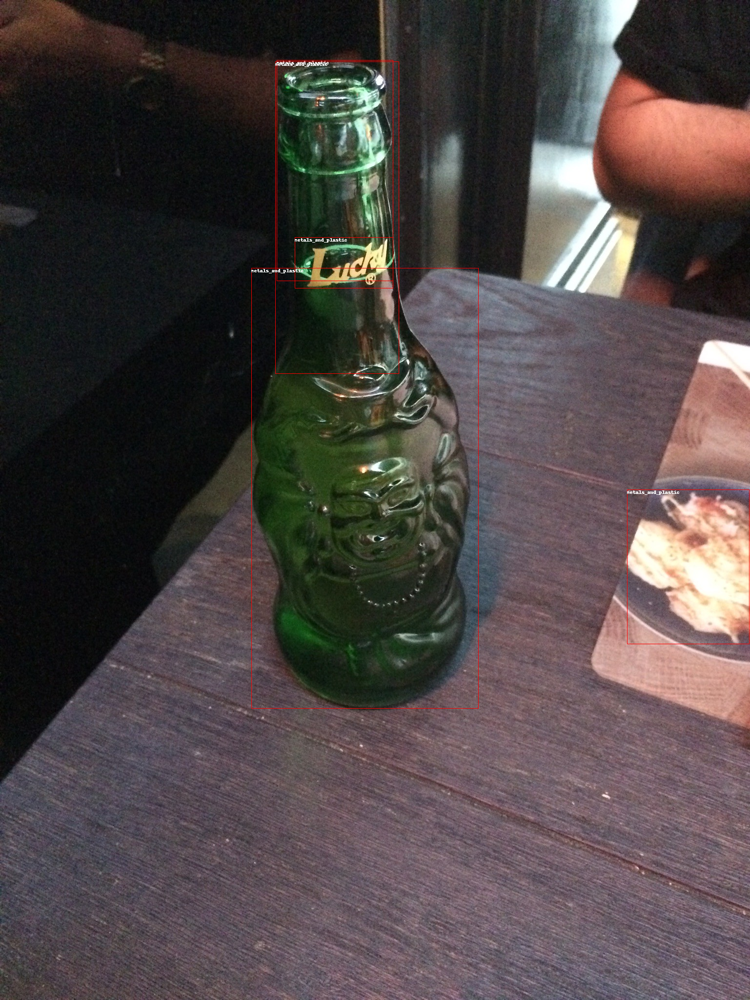

In [28]:
draw = ImageDraw.Draw(image)

for score, label, box in zip(results["scores"], results["labels"], results["boxes"]):
    box = [round(i, 2) for i in box.tolist()]
    x, y, x2, y2 = tuple(box)
    draw.rectangle((x, y, x2, y2), outline="red", width=1)
    draw.text((x, y), model.config.id2label[label.item()], fill="white")

image